# Selección de Modelo de Machine Learning para el cálculo de Energía de Nanopartículas Metálicas: 🌕🌟🌕
---
---

In [2]:
# LIBRERIAS:

# Basicas
import os 
import warnings
warnings.filterwarnings('ignore')
import datetime as dt
import random
import pickle
import json
import csv
import re

import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import scipy.stats as ss
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, LeaveOneOut
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score


In [4]:
os.chdir(os.path.normpath(os.getcwd() + os.sep + os.pardir))
os.getcwd()

'/Users/N716188/Documents/ProjectML/ML_NanoparticulasAu_TBDS/src'

In [5]:
from utils.path import *
from utils.librerias import * 
from utils.funciones import *
from utils.params import *

# ${\textcolor{Red}{Datos}}$ 

In [6]:
data = pd.read_csv(DataAu)
data.set_index('ID', inplace = True)

In [7]:
data.sample(5)

,T,tau,time,N_total,N_bulk,N_surface,Volume,R_min,R_max,R_diff,...,q6q6_S14,q6q6_S15,q6q6_S16,q6q6_S17,q6q6_S18,q6q6_S19,q6q6_S20,q6q6_S20+,Total_E,Formation_E
ID,,,,,,,,,,,,,,,,,,,,,
2121,673,0.000075,1,1446,910,536,2.450000e-26,14.6999,19.6139,4.9140,...,0,0,0,0,0,0,0,0,-5223.56920,430.29080
1616,523,0.000000,10,2176,1466,710,3.680000e-26,16.1075,25.1432,9.0357,...,0,0,0,0,0,0,0,0,-7902.31990,605.84010
2210,723,0.000000,10,273,114,159,4.620000e-27,7.6591,10.7811,3.1220,...,0,0,0,0,0,0,0,0,-935.32622,132.10378
2737,723,0.000000,10,6339,4739,1600,1.070000e-25,24.7163,32.7612,8.0450,...,0,0,0,0,0,0,0,0,-22959.76100,1825.72900
2781,723,0.000000,10,10943,8714,2229,1.850000e-25,30.0248,39.3050,9.2802,...,0,0,0,0,0,0,0,0,-39828.39700,2958.73300


### Informacion sobre la data 

In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4000 entries, 1 to 4000
Columns: 184 entries, T to Formation_E
dtypes: float64(23), int64(161)
memory usage: 5.6 MB


Un reporte sobre la base de datos, donde se observan los tipos de data, los missings y los valores unicos

In [15]:
data_report(data)

COL_N,T,tau,time,N_total,N_bulk,N_surface,Volume,R_min,R_max,R_diff,...,q6q6_S14,q6q6_S15,q6q6_S16,q6q6_S17,q6q6_S18,q6q6_S19,q6q6_S20,q6q6_S20+,Total_E,Formation_E
DATA_TYPE,int64,float64,int64,int64,int64,int64,float64,float64,float64,float64,...,int64,int64,int64,int64,int64,int64,int64,int64,float64,float64
MISSINGS (%),0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.02
UNIQUE_VALUES,16,11,10,1898,2473,1663,883,3948,3974,3923,...,1,1,1,1,1,1,1,1,3996,3995
CARDIN (%),0.4,0.28,0.25,47.45,61.82,41.58,22.08,98.7,99.35,98.08,...,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,99.9,99.88


### ${\textcolor{orange}{Missings}}$ 

Parece que no hay valores faltantes, pero de todas formas se comprueba el porcentaje de missings

In [16]:
precent_missing = data.isnull().sum()*100/len(data)
missing_value_df = pd.DataFrame({'column_name': data.columns,
                                'percent_missing': precent_missing}).sort_values('percent_missing', ascending=False)
missing_value_df

,column_name,percent_missing
Formation_E,Formation_E,0.025
q6q6_T10,q6q6_T10,0.000
q6q6_T1,q6q6_T1,0.000
q6q6_T2,q6q6_T2,0.000
q6q6_T3,q6q6_T3,0.000
...,...,...
BCN_3,BCN_3,0.000
BCN_4,BCN_4,0.000
BCN_5,BCN_5,0.000
BCN_6,BCN_6,0.000


In [19]:
data[data['Formation_E'].isna()]

,T,tau,time,N_total,N_bulk,N_surface,Volume,R_min,R_max,R_diff,...,q6q6_S14,q6q6_S15,q6q6_S16,q6q6_S17,q6q6_S18,q6q6_S19,q6q6_S20,q6q6_S20+,Total_E,Formation_E
ID,,,,,,,,,,,,,,,,,,,,,
4000,973,0.00025,10,3986,2785,1201,6.750000e-26,19.1334,44.7678,25.6344,...,0,0,0,0,0,0,0,0,-14264.397,NaN


Se observa que  solo la ultima entrada no tiene la información de energia de formación. Como se cuentan con suficiente cantidad de datos se procede a eliminar dicha entrada

In [13]:
data =data.drop([4000],axis=0)

### ${\textcolor{orange}{\text{Features con ceros}}}$ 

No hay valores faltantes pero si hay gran cantidad de valores ceros y de hecho columnas donde el 100% de los datos son nuelos. Por lo que se proceden a eliminar dichas características.

In [9]:
precent_zeros = (data==0).sum()*100/len(data)
zeros_value_df = pd.DataFrame({'column_name': data.columns,
                                'percent_zeros': precent_zeros}).sort_values('percent_zeros', ascending=False)
with pd.option_context("display.max_rows", None):
    display(zeros_value_df)

,column_name,percent_zeros
q6q6_B20+,q6q6_B20+,100.000
SCN_16,SCN_16,100.000
Curve_141-150,Curve_141-150,100.000
Curve_151-160,Curve_151-160,100.000
Curve_161-170,Curve_161-170,100.000
Curve_171-180,Curve_171-180,100.000
TCN_0,TCN_0,100.000
q6q6_B19,q6q6_B19,100.000
q6q6_B16,q6q6_B16,100.000
q6q6_B17,q6q6_B17,100.000


Luego de analizar si son de importancia en las propiedades fisicas de las nanoparticulas, se procede a eliminar las caracteristicas que cuentan con mas del 60% de sus valores igual a cero

In [10]:
cols_to_drop = zeros_value_df[zeros_value_df['percent_zeros'] > 60].index.values
print("Cols:", cols_to_drop)

print("Columnas pre drop:", len(data.columns))

data.drop(columns=cols_to_drop, inplace=True)

print("Columnas post drop:", len(data.columns))

Cols: ['q6q6_B20+' 'SCN_16' 'Curve_141-150' 'Curve_151-160' 'Curve_161-170'
 'Curve_171-180' 'TCN_0' 'q6q6_B19' 'q6q6_B16' 'q6q6_B17' 'SCN_20'
 'SCN_19' 'SCN_18' 'SCN_17' 'TCN_18' 'Curve_121-130' 'TCN_19' 'TCN_20'
 'BCN_0' 'BCN_1' 'BCN_2' 'BCN_3' 'BCN_4' 'q6q6_B20' 'BCN_18' 'BCN_19'
 'BCN_20' 'SCN_0' 'Curve_131-140' 'q6q6_B18' 'Curve_111-120' 'q6q6_T19'
 'q6q6_T17' 'q6q6_T16' 'q6q6_T20' 'q6q6_T20+' 'q6q6_S20+' 'q6q6_S20'
 'Curve_101-110' 'q6q6_S14' 'q6q6_S15' 'q6q6_S16' 'q6q6_S17' 'q6q6_S19'
 'q6q6_S18' 'Curve_81-90' 'Curve_91-100' 'q6q6_T18' 'TCN_17' 'BCN_5'
 'SCN_15' 'BCN_17' 'BCN_6' 'q6q6_B15' 'q6q6_T15' 'BCN_7' 'SCN_14'
 'q6q6_S13' 'ICOS' 'BCN_16' 'TCN_16' 'Curve_71-80' 'TCN_1' 'SCN_1' 'SCN_2'
 'TCN_2' 'BCN_8' 'SCN_3' 'TCN_3' 'BCN_9' 'q6q6_S12' 'SCN_13']
Columnas pre drop: 184
Columnas post drop: 112


In [ ]:
data = data.drop("time", axis=1)

In [16]:
data

,T,tau,N_total,N_bulk,N_surface,Volume,R_min,R_max,R_diff,R_avg,...,q6q6_S4,q6q6_S5,q6q6_S6,q6q6_S7,q6q6_S8,q6q6_S9,q6q6_S10,q6q6_S11,Total_E,Formation_E
ID,,,,,,,,,,,,,,,,,,,,,
1,273,0.000025,1599,1014,585,2.710000e-26,15.5898,19.4516,3.8618,17.3706,...,33,25,18,18,13,18,1,0,-5908.6345,343.4555
2,273,0.000025,1642,1034,608,2.780000e-26,15.3996,24.1755,8.7760,17.6061,...,32,26,26,6,15,12,2,0,-6035.4034,384.8166
3,273,0.000025,4637,3365,1272,7.850000e-26,21.9199,31.0305,9.1106,25.3692,...,95,99,117,123,99,116,51,17,-17330.1660,800.5040
4,273,0.000025,7189,5292,1897,1.220000e-25,23.2542,37.8795,14.6253,29.7011,...,135,147,188,214,227,227,121,64,-26937.2010,1171.7890
5,273,0.000025,11004,8508,2496,1.860000e-25,27.1200,39.7614,12.6415,34.2831,...,154,190,281,308,287,320,156,74,-41427.9010,1597.7390
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3995,973,0.000250,1201,683,518,2.030000e-26,11.7580,31.2844,19.5264,16.7874,...,2,0,0,0,0,0,0,0,-4230.5430,465.3670
3996,973,0.000250,1509,950,559,2.550000e-26,13.8048,23.1729,9.3681,17.4079,...,3,0,0,1,0,0,0,0,-5346.9589,553.2311
3997,973,0.000250,2315,1469,846,3.920000e-26,12.0020,36.7573,24.7553,21.2937,...,4,0,0,0,0,0,0,0,-8218.1252,833.5248


In [19]:
data.to_csv("data/raw/subdata/data_sin_ceros.csv")

In [20]:
data_sav = pd.read_csv("data/raw/subdata/data_sin_ceros.csv")

### ${\textcolor{orange}{\text{Features fuera del alcance del análisis físico}}}$ 

Los parámetros de orden basados en armónicos esféricos y coeficientes de Fourier ya juegan un papel importante en la investigación de materia condensada en el contexto de sistemas de partículas esféricas o puntuales. Pero se considera que para el presente análisis es suficiente con tomar los valores promedios de dichos parametros de orden. por lo que se eliminan todas las caracterisicas `q6q6_*` y solo quedan `q6q6_avg_total	q6q6_avg_bulk	q6q6_avg_surf`

In [45]:
data = read_data(DataAu)
data = del_zeros(data, 60)

Cols: ['q6q6_B20+' 'SCN_16' 'Curve_141-150' 'Curve_151-160' 'Curve_161-170'
 'Curve_171-180' 'TCN_0' 'q6q6_B19' 'q6q6_B16' 'q6q6_B17' 'SCN_20'
 'SCN_19' 'SCN_18' 'SCN_17' 'TCN_18' 'Curve_121-130' 'TCN_19' 'TCN_20'
 'BCN_0' 'BCN_1' 'BCN_2' 'BCN_3' 'BCN_4' 'q6q6_B20' 'BCN_18' 'BCN_19'
 'BCN_20' 'SCN_0' 'Curve_131-140' 'q6q6_B18' 'Curve_111-120' 'q6q6_T19'
 'q6q6_T17' 'q6q6_T16' 'q6q6_T20' 'q6q6_T20+' 'q6q6_S20+' 'q6q6_S20'
 'Curve_101-110' 'q6q6_S14' 'q6q6_S15' 'q6q6_S16' 'q6q6_S17' 'q6q6_S19'
 'q6q6_S18' 'Curve_81-90' 'Curve_91-100' 'q6q6_T18' 'TCN_17' 'BCN_5'
 'SCN_15' 'BCN_17' 'BCN_6' 'q6q6_B15' 'q6q6_T15' 'BCN_7' 'SCN_14'
 'q6q6_S13' 'ICOS' 'BCN_16' 'TCN_16' 'Curve_71-80' 'TCN_1' 'SCN_1' 'SCN_2'
 'TCN_2' 'BCN_8' 'SCN_3' 'TCN_3' 'BCN_9' 'q6q6_S12' 'SCN_13' 'tau']
Columnas pre drop: 184
Columnas post drop: 111


In [47]:
q6q6_avg = data[["q6q6_avg_total", "q6q6_avg_bulk", "q6q6_avg_surf"]]

In [48]:
data = data.loc[:, ~data.columns.str.startswith('q6q6')]

In [50]:
data = data.join(q6q6_avg)

In [53]:
data

,T,time,N_total,N_bulk,N_surface,Volume,R_min,R_max,R_diff,R_avg,...,angle_avg,angle_std,FCC,HCP,DECA,Total_E,Formation_E,q6q6_avg_total,q6q6_avg_bulk,q6q6_avg_surf
ID,,,,,,,,,,,,,,,,,,,,,
1,273,1,1599,1014,585,2.710000e-26,15.5898,19.4516,3.8618,17.3706,...,95.5363,34.169839,24,23,8,-5908.6345,343.4555,2.5153,2.7535,2.1026
2,273,2,1642,1034,608,2.780000e-26,15.3996,24.1755,8.7760,17.6061,...,95.5073,34.245992,30,35,7,-6035.4034,384.8166,2.5335,2.9188,1.8783
3,273,3,4637,3365,1272,7.850000e-26,21.9199,31.0305,9.1106,25.3692,...,96.0506,34.609982,700,376,17,-17330.1660,800.5040,7.3030,8.4074,4.3813
4,273,4,7189,5292,1897,1.220000e-25,23.2542,37.8795,14.6253,29.7011,...,96.3417,34.742688,1858,823,11,-26937.2010,1171.7890,9.5565,11.0017,5.5250
5,273,5,11004,8508,2496,1.860000e-25,27.1200,39.7614,12.6415,34.2831,...,96.5052,34.859251,3575,1350,28,-41427.9010,1597.7390,9.8630,11.1281,5.5505
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3995,973,5,1201,683,518,2.030000e-26,11.7580,31.2844,19.5264,16.7874,...,95.0182,34.012143,0,0,0,-4230.5430,465.3670,0.4779,0.5593,0.3707
3996,973,6,1509,950,559,2.550000e-26,13.8048,23.1729,9.3681,17.4079,...,95.2984,34.039999,0,0,0,-5346.9589,553.2311,0.4374,0.5000,0.3309
3997,973,7,2315,1469,846,3.920000e-26,12.0020,36.7573,24.7553,21.2937,...,95.3473,34.027402,0,0,0,-8218.1252,833.5248,0.4700,0.5296,0.3664


In [44]:
#AUTOMATIZACIÓN DE LIMPIEZA
def read_data(path):
    data = pd.read_csv(path).dropna()
    data.set_index('ID', inplace = True)
    return data

def del_zeros(data, percent):
    precent_zeros = (data==0).sum()*100/len(data)
    zeros_value_df = pd.DataFrame({'column_name': data.columns,
                                'percent_zeros': precent_zeros}).sort_values('percent_zeros', ascending=False)

    cols_to_drop = zeros_value_df[zeros_value_df['percent_zeros'] > percent].index.values
    print("Cols:", cols_to_drop)

    print("Columnas pre drop:", len(data.columns))

    data.drop(columns=cols_to_drop, inplace=True)

    print("Columnas post drop:", len(data.columns))
    return data

def del_no_vip(data):
    q6q6_avg = data[["q6q6_avg_total", "q6q6_avg_bulk", "q6q6_avg_surf"]]
    data = data.loc[:, ~data.columns.str.startswith('q6q6')]
    data = data.join(q6q6_avg)
    data.drop("time", axis=1)
    return data

def create_subdatasets():

### ${\textcolor{orange}{Correlaciones}}$ 

In [28]:
data_corr = data.corr()
data_corr 

,T,tau,time,N_total,N_bulk,N_surface,Volume,R_min,R_max,R_diff,...,q6q6_S4,q6q6_S5,q6q6_S6,q6q6_S7,q6q6_S8,q6q6_S9,q6q6_S10,q6q6_S11,Total_E,Formation_E
T,1.000000,-0.036333,0.033817,-0.014396,-0.004974,-0.052871,-0.014350,0.078622,-0.047303,-0.162397,...,-0.101474,-0.149655,-0.268372,-0.386383,-0.295729,-0.277083,-0.296424,-0.273476,0.029147,0.248701
tau,-0.036333,1.000000,-0.639896,0.009165,-0.006485,0.073452,0.009161,-0.132635,0.241849,0.533424,...,0.163820,0.106456,-0.003659,-0.121101,-0.131499,-0.207837,-0.070645,-0.107971,-0.011413,-0.032021
time,0.033817,-0.639896,1.000000,0.060622,0.064611,0.042594,0.060666,0.109527,-0.059762,-0.216410,...,-0.026182,0.034981,0.137466,0.225025,0.221073,0.267607,0.155836,0.131890,-0.058270,0.096280
N_total,-0.014396,0.009165,0.060622,1.000000,0.998776,0.978982,0.999998,0.917639,0.861840,0.368474,...,0.651497,0.687642,0.697532,0.650556,0.593240,0.466319,0.625603,0.353737,-0.999716,0.906140
N_bulk,-0.004974,-0.006485,0.064611,0.998776,1.000000,0.967695,0.998774,0.918549,0.839996,0.332496,...,0.637341,0.674549,0.687163,0.639813,0.588942,0.457160,0.618136,0.346122,-0.998495,0.904981
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
q6q6_S9,-0.277083,-0.207837,0.267607,0.466319,0.457160,0.491924,0.466419,0.415003,0.492945,0.331842,...,0.209314,0.273862,0.349409,0.437147,0.475784,1.000000,0.465075,0.107901,-0.470263,0.350323
q6q6_S10,-0.296424,-0.070645,0.155836,0.625603,0.618136,0.640081,0.625515,0.544517,0.541324,0.266550,...,0.488675,0.602957,0.737885,0.821182,0.498257,0.465075,1.000000,0.407399,-0.633487,0.423896
q6q6_S11,-0.273476,-0.107971,0.131890,0.353737,0.346122,0.375914,0.353692,0.352495,0.273191,0.048886,...,0.149132,0.267138,0.463691,0.730487,0.276447,0.107901,0.407399,1.000000,-0.359767,0.211778
Total_E,0.029147,-0.011413,-0.058270,-0.999716,-0.998495,-0.978691,-0.999712,-0.913863,-0.860246,-0.370084,...,-0.655250,-0.693165,-0.705086,-0.659134,-0.599088,-0.470263,-0.633487,-0.359767,1.000000,-0.895804


Ya se observa que hay caracteristicas fuertemente correlacionadas. Se observa mejor en un heatmap, pero como aun se cuenta con demasiadas variables, por lo que se escojen por grupos

<AxesSubplot:>

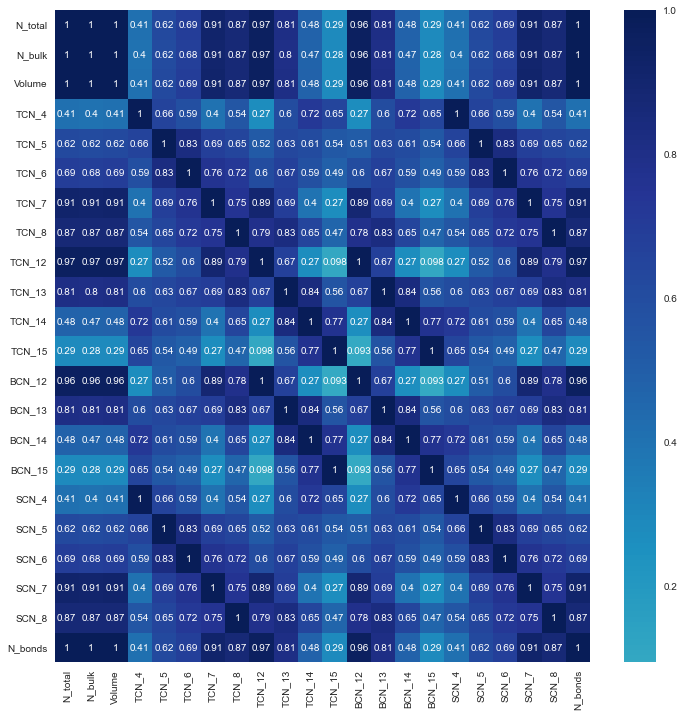

In [68]:
plt.figure(figsize=(12,12))
high_corr_columns=data.columns[list(data.corr().apply( lambda value: value >0.999 ).sum()>1)]
sns.heatmap(data[high_corr_columns].corr(method='spearman'),cmap="YlGnBu", annot=True, center=0)

<AxesSubplot:>

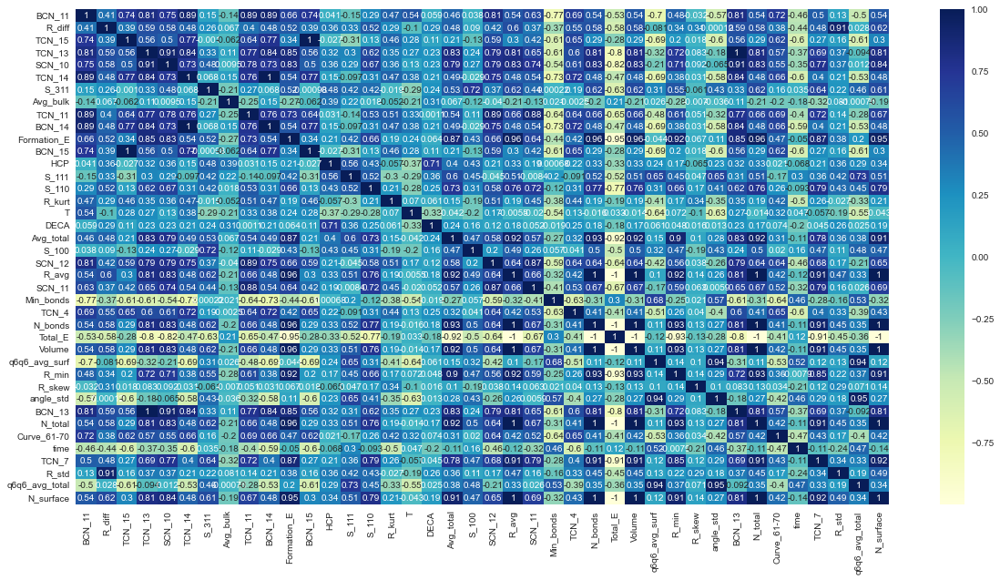

In [58]:
plt.figure(figsize=(20,10))
sns.heatmap(data[random.sample(data.columns.to_list(), 40)].corr(method='spearman'),cmap="YlGnBu", annot=True)

Las variables independientes deberían de ser independientes entre sí. Cuando el grado de la relación entre las variables es lo suficientemente grande puede provocar problemas tanto en el proceso de ajuste como en la interpretación de los datos.

Se tiene el riesgo de que en el proceso de entrenamiento del modelo de Aprendizaje Automático Supervisado se esté utilizando información «duplicada» y, debido a esta duplicidad en la información, los procesos de entrenamiento no pueden encontrar los parámetros adecuados para la correcta construcción de los modelos predictivos.

Una solución a este problema es utilizar el Factor de Inflación de la Varianza (VIF, de sus siglas en inglés, Variance Inflation Factor), que permite cuantificar la intensidad de la multicolinealidad. La definición de este factor es:

 $VIF_{i} = \frac{1}{1-R_{i}^2}$

donde $VIF_{i}$ es el valor del factor para la característica i y $R_{i}$ es coeficiente de determinación (es decir el famoso R de la regresión…) para la característica i.


El valor del VIF es siempre positivo y crece en un conjunto de datos a medida que aumenta la multicolinealidad entre las características. En caso de que en un conjunto de características exista multicolinealidad perfecta, es decir, que una característica se pueda explicar perfectamente mediante la combinación lineal del resto,  el valor será infinito, ya que, en tal caso, el $R_{i}^2$ de la regresión será igual la unidad.

Se ve que es exactamente lo que sucede con el dataset tratado

En general se suele tener el criterio de Grado de Muticolinealidad Débil a Moderado cuando el valor de VIF es menor a 5. 

Se seleccionan las variables predictoras

In [101]:
X = data.drop(["Total_E"], 1)
y = data[["Total_E"]].squeeze()

In [114]:
def calcular_VIF(var_predictoras_df):
    var_pred_labels = list(var_predictoras_df.columns)
    num_var_pred = len(var_pred_labels)
    
    lr_model = LinearRegression()
    
    vifs = pd.DataFrame(index = ['VIF'], columns = var_pred_labels)
    vifs = vifs.fillna(0)
    
    for i in range(num_var_pred):
        x_features = var_pred_labels[:]
        y_feature = var_pred_labels[i]
        x_features.remove(y_feature)
        
        x = var_predictoras_df[x_features]
        y = var_predictoras_df[y_feature]
        
        lr_model.fit(var_predictoras_df[x_features], var_predictoras_df[y_feature])
        r2=lr_model.score(var_predictoras_df[x_features], var_predictoras_df[y_feature])
        vifs[y_feature] = 1/(1 - r2)
    
    return vifs

In [116]:
vifs_calculados =calcular_VIF(data)


In [118]:
with pd.option_context("display.max_rows", None):
    display(vifs_calculados.T.sort_values("VIF", ascending=False))

,VIF
TCN_11,inf
Formation_E,inf
SCN_4,inf
BCN_12,inf
BCN_11,inf
BCN_10,inf
TCN_12,inf
SCN_10,inf
TCN_10,inf
TCN_4,inf


Una vez obtenido el VIF, hay que definir un proceso para la eliminación de características. El proceso se puede resumir en los siguientes pasos:

1) Seleccionar un valor umbral del VIF para la eliminación: Suele emplearse el valor de 5 de acuerdo a lo mostrado en la Tabla de Criterios que te mostré anteriormente.


2) Obtener el valor del VIF de todas las características/variables

3) Identificar la característica con VIF más elevado.

4) Si este valor supera el umbral definido, la característica se elimina del conjunto y se vuelve al punto 2, en caso contrario, el proceso termina.

In [141]:
def Select_Data_con_VIF(var_predictoras_df, max_VIF = 10):
    vifs_calculados = var_predictoras_df.copy(deep = True)
    
    VIF = calcular_VIF(vifs_calculados)
    
    while VIF.values.max() > max_VIF:
        col_max = np.where(VIF == VIF.values.max())[1][0]
        features = list(vifs_calculados.columns)
        features.remove(features[col_max])
        vifs_calculados = vifs_calculados[features]
        
        VIF = calcular_VIF(vifs_calculados)
        
    return vifs_calculados

In [120]:
data_selected = Select_Data_con_VIF(data)

In [121]:
data_selected.columns

Index(['T', 'time', 'R_std', 'R_skew', 'R_kurt', 'S_100', 'S_111', 'S_110',
       'S_311', 'Curve_51-60', 'Curve_61-70', 'Avg_bulk', 'Avg_surf', 'TCN_5',
       'TCN_6', 'TCN_15', 'BCN_10', 'BCN_14', 'SCN_4', 'SCN_12', 'Max_bonds',
       'Min_bonds', 'HCP', 'DECA', 'q6q6_avg_bulk'],
      dtype='object')

El problema de este procedimiento es que elimina variables que son fisicamente importantes para la interpretacion de los resultados. Por lo que se ignora esta selección y se procede con algo más lógico. Por ejemplo la separación del data set según el tipo de caracteristica.

Es posible realizar una separación de la base de datos según el tipo de carcteristicas que describe cada variable. Se agrupan en 3 conjuntos diferentes que capturan diferentes tipos de información sobre las nanopartículas. Los 3 conjuntos de características se denominan Bulk (B), Superficiales (S) y Totales (T). El conjunto de características de bulk solo contendrá características que pertenecen a los átomos interiores, incluidos los números de coordinación, los tipos de red y los parámetros de orden. El segundo conjunto solo contiene características que pertenecen a los átomos exteriores, incluidos los números de coordinación, las orientaciones de las facetas de la superficie y los rangos de curvaturas de la superficie. El conjunto de características totales solo contiene características que involucran medidas globales (como el radio de nanopartículas), promedios y números de coordinación y parámetros de orden calculados sobre todos los átomos en la partícula.

In [83]:
bulk = [i for i in data if  any(re.findall( "bulk|BCN_|FCC|HCP|ICOS|DECA" , i)) | (i.startswith('B')) | ("_B" in i)]
super = [i for i in data if  any(re.findall( "surf|_S" , i)) | any(map(i.startswith, ["S_","Curve","SCN_"]))]
totales = [i for i in data if  any(re.findall( "total|Volume|_T|bonds|angle" , i)) |  any(map(i.startswith, ['R',"TCN_"]))]

In [84]:
data_bulk = data[bulk]
data_super = data[super]
data_total = data[totales]

In [92]:
print(os.getcwd())

/Users/N716188/Documents/ProjectML/ML_NanoparticulasAu_TBDS


In [100]:
path=os.getcwd()
folder = path+"/src/data/raw/subdata_"
os.mkdir(folder)
data_total.to_csv(f"{folder}/data_total.csv", index=False)
data_bulk.to_csv(f"{folder}/data_bulk.csv", index=False)
data_super.to_csv(f"{folder}/data_super.csv", index=False)

In [122]:
datasets = [data_bulk, data_super, data_total]

In [125]:
for dataset in datasets:
    print(dataset.shape)
    print(dataset.columns.tolist() , "\n")

(3999, 12)
['N_bulk', 'Avg_bulk', 'BCN_10', 'BCN_11', 'BCN_12', 'BCN_13', 'BCN_14', 'BCN_15', 'FCC', 'HCP', 'DECA', 'q6q6_avg_bulk'] 

(3999, 23)
['N_surface', 'S_100', 'S_111', 'S_110', 'S_311', 'Curve_1-10', 'Curve_11-20', 'Curve_21-30', 'Curve_31-40', 'Curve_41-50', 'Curve_51-60', 'Curve_61-70', 'Avg_surf', 'SCN_4', 'SCN_5', 'SCN_6', 'SCN_7', 'SCN_8', 'SCN_9', 'SCN_10', 'SCN_11', 'SCN_12', 'q6q6_avg_surf'] 

(3999, 30)
['N_total', 'Volume', 'R_min', 'R_max', 'R_diff', 'R_avg', 'R_std', 'R_skew', 'R_kurt', 'Avg_total', 'TCN_4', 'TCN_5', 'TCN_6', 'TCN_7', 'TCN_8', 'TCN_9', 'TCN_10', 'TCN_11', 'TCN_12', 'TCN_13', 'TCN_14', 'TCN_15', 'Avg_bonds', 'Std_bonds', 'Max_bonds', 'Min_bonds', 'N_bonds', 'angle_avg', 'angle_std', 'q6q6_avg_total'] 



Ahora se comprueba la multicolinealidad de estos sets

In [127]:
for dataset in datasets:
    print("Dataset", dataset.columns[0][2:].upper())
    vifs_calculados =calcular_VIF(dataset)
    with pd.option_context("display.max_rows", None):
        display(vifs_calculados.T.sort_values("VIF", ascending=False))
    print("\n")

Dataset BULK


,VIF
N_bulk,942136.444533
BCN_12,573576.888906
BCN_13,31267.424781
BCN_11,19136.190979
BCN_10,2547.486989
BCN_14,812.596352
FCC,78.238119
BCN_15,10.283275
HCP,5.456616
q6q6_avg_bulk,1.813502




Dataset SURFACE


,VIF
N_surface,6.112497e+06
Curve_1-10,1.148297e+06
Curve_21-30,9.967725e+05
Curve_11-20,4.422116e+05
Curve_31-40,3.228937e+05
SCN_9,3.224320e+04
SCN_8,1.117843e+04
SCN_10,7.389228e+03
SCN_7,7.053572e+03
Curve_41-50,6.575103e+03




Dataset TOTAL


,VIF
R_max,3.826257e+10
R_min,1.814833e+10
R_diff,1.491335e+10
N_bonds,1.464799e+08
TCN_12,4.170961e+07
N_total,1.806311e+07
TCN_13,2.706665e+06
TCN_11,1.388551e+06
TCN_9,2.920886e+05
Volume,2.421266e+05


In [149]:
def Select_Data_con_VIF(var_predictoras_df, max_VIF = 10):
    vifs_calculados = var_predictoras_df.copy(deep = True)
    
    VIF = calcular_VIF(vifs_calculados)
    
    while VIF.values.max() > max_VIF:
        col_max = np.where(VIF == VIF.values.max())[1][0]
        features = list(vifs_calculados.columns)
        features.remove(features[col_max])
        vifs_calculados = vifs_calculados[features]
        VIF = calcular_VIF(vifs_calculados)
    print(vifs_calculados.columns.to_list())
    return vifs_calculados

In [150]:
for dataset in datasets:
    print("Dataset", dataset.columns[0][2:].upper())
    data_selected = Select_Data_con_VIF(dataset)
    vifs_calculados =calcular_VIF(data_selected)
    with pd.option_context("display.max_rows", None):
        display(vifs_calculados.T.sort_values("VIF", ascending=False))
    print("\n")

Dataset BULK
['Avg_bulk', 'BCN_10', 'BCN_13', 'BCN_15', 'FCC', 'HCP', 'DECA', 'q6q6_avg_bulk']


,VIF
BCN_15,5.047700
BCN_10,4.873010
BCN_13,2.703035
HCP,2.221411
FCC,1.847874
q6q6_avg_bulk,1.725055
DECA,1.680091
Avg_bulk,1.592118




Dataset SURFACE
['S_100', 'S_111', 'S_110', 'S_311', 'Curve_11-20', 'Curve_51-60', 'Curve_61-70', 'Avg_surf', 'SCN_4', 'SCN_5', 'SCN_6', 'SCN_12', 'q6q6_avg_surf']


,VIF
Curve_51-60,6.891507
SCN_12,6.416926
SCN_6,5.776554
Curve_11-20,5.299177
SCN_5,5.219012
SCN_4,4.093789
Avg_surf,2.698025
Curve_61-70,2.698000
q6q6_avg_surf,2.688800
S_110,2.082076




Dataset TOTAL
['R_std', 'R_skew', 'R_kurt', 'TCN_4', 'TCN_5', 'TCN_6', 'TCN_7', 'TCN_8', 'TCN_9', 'TCN_10', 'TCN_14', 'TCN_15', 'Avg_bonds', 'Max_bonds', 'Min_bonds', 'angle_avg', 'q6q6_avg_total']


,VIF
TCN_10,8.831789
q6q6_avg_total,6.302671
TCN_15,5.551617
angle_avg,5.475789
TCN_5,5.232492
TCN_14,4.382104
Avg_bonds,4.141129
TCN_7,4.020185
TCN_6,3.962269
TCN_8,3.273139


Se analiza a continuación cual es el impacto en el rendimiento predictivo
ya que la multicolinealidad deberia tener poca relación con el rendimiento predictivo de un modelo.

Se verifica esto creando dos modelos de regresión lineal. Uno se entrena sin ninguna selección de caracteristicas y el otro se entrena después de la selección de funciones.

In [156]:
# data sets sin eliminar las features
datasets

#Datasets con las features seleccionadas por VIF
data_bulk_2 = data_bulk[['Avg_bulk', 'BCN_10', 'BCN_13', 'BCN_15', 'FCC', 'HCP', 'DECA', 'q6q6_avg_bulk']]
data_super_2 = data_super[['S_100', 'S_111', 'S_110', 'S_311', 'Curve_11-20', 'Curve_51-60', 'Curve_61-70', 'Avg_surf', 'SCN_4', 'SCN_5', 'SCN_6', 'SCN_12', 'q6q6_avg_surf']]
data_total_2 = data_total[['R_std', 'R_skew', 'R_kurt', 'TCN_4', 'TCN_5', 'TCN_6', 'TCN_7', 'TCN_8', 'TCN_9', 'TCN_10', 'TCN_14', 'TCN_15', 'Avg_bonds', 'Max_bonds', 'Min_bonds', 'angle_avg', 'q6q6_avg_total']]
datasets_2 = [data_bulk_2, data_super_2, data_total_2]

In [200]:
for dataset in datasets:
    X_train, X_test, y_train, y_test = train_test_split(dataset, data["Total_E"], test_size=0.25, random_state=42)
   
    lr = LinearRegression()
    lr.fit(X_train, y_train)
    y_pred = lr.predict(X_test)
    mse = round(np.sqrt(mean_squared_error(y_test, y_pred)), 4)
    print(f'Mean squared error sin tratar multicolinealidad: {mse}')

print("\n")
for dataset2 in datasets_2:
    X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(dataset2, data["Total_E"], test_size=0.25, random_state=42)
    
    lr_2 = LinearRegression()
    lr_2.fit(X_train_2, y_train_2)
    y_pred_2 = lr_2.predict(X_test_2)
    mse_2 = round(np.sqrt(mean_squared_error(y_test_2, y_pred_2)), 4)
    print(f'Mean squared error tratando multicolinealidad: {mse_2}')

Mean squared error sin tratar multicolinealidad: 595.423
Mean squared error sin tratar multicolinealidad: 2059.719
Mean squared error sin tratar multicolinealidad: 170.4161


Mean squared error tratando multicolinealidad: 1550.5926
Mean squared error tratando multicolinealidad: 2638.7987
Mean squared error tratando multicolinealidad: 1641.468


### ${\textcolor{RED}{Problem}}$ 
Como se muestra en el resultado, la modificación que se realiza no es buena para los modelos. se ve claramente el muestra el impacto insignificante que tiene la eliminación de variables altamente correlacionadas en el rendimiento del modelo.

# Analisis Univariante

### ${\textcolor{Orange}{Target}}$ 

In [183]:
target = data["Total_E"]

 Resumen de estadística descriptiva:

In [168]:
target.describe()

,Total_E
count,3999.000000
mean,-12742.281317
std,13692.690338
min,-53772.854000
25%,-16505.479000
50%,-6753.675400
75%,-3785.004200
max,-783.428590


<AxesSubplot:ylabel='Density'>

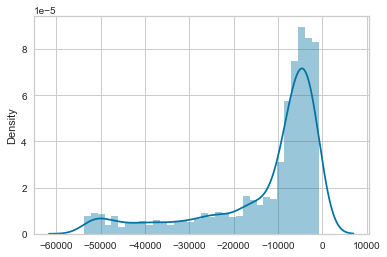

In [169]:
sns.distplot(target)

Lo ideal es tener distribuciones normales en todas las variables (target incluido).
Para comprobar si tenemos una distribución normal, lo mejor es graficarla, pero siempre tenemos la opción de calcular un valor numérico que nos indique si la distribución es normal o no. Para ello podemos aplicar el test de Shapiro, cuya hipótesis nula es que la variable sigue una distribución normal, mientras que la alternativa sostiene que no sigue una distribución normal. Si el p-value es mucho menor que su nivel de significación (0.05), tendremos que rechazar la hipotésis nula y asegurar que la variable NO sigue una distribución normal.

D'Agostino's K2 test:
	 Estadístico = 1011.7373924931042, p-value = 2.0138014653191357e-220
P_Valor < 0.05 -> Se rechaza H0 
	  No es posible asegurar que Total_E sigue una distribución normal.
********************************************************************************


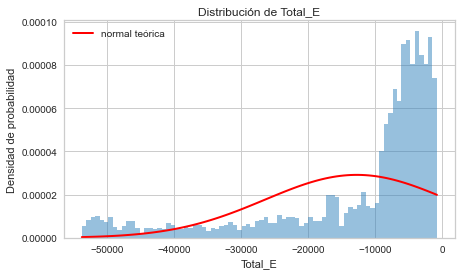

In [177]:
Test_Normalidad(data, "Total_E")

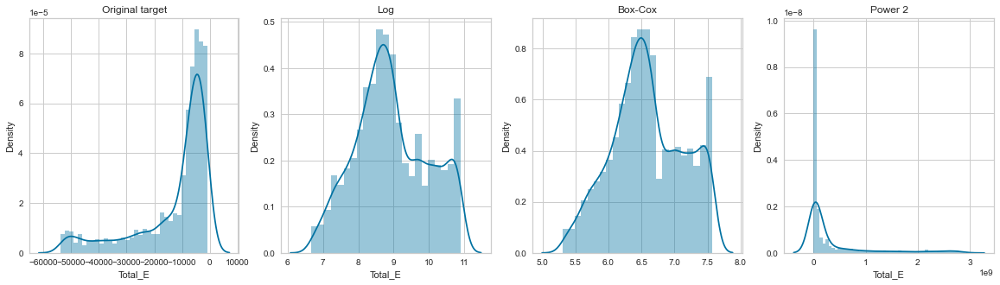

In [188]:
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

# Original target
sns.distplot(target, ax=axes[0])
axes[0].set_title("Original target")

# Logaritmic
sns.distplot(np.log(abs(target)), ax=axes[1])
axes[1].set_title("Log")

# Box-cox
sns.distplot(ss.boxcox(abs(target))[0], ax=axes[2])
axes[2].set_title("Box-Cox");

# Power 2
sns.distplot(np.power(target, 2), ax=axes[3])
axes[3].set_title("Power 2");

Administrar manualmente el escalado de esta variable  implica crear y aplicar el objeto de escalado a los datos manualmente.

se realizan los siguientes pasos:

Se crea el objeto de transformación, luego se ajusta la transformación en el conjunto de datos de entrenamiento. Se Aplica la transformación a los conjuntos de datos de entrenamiento y prueba.

Por ultimo se invierte la transformación en cualquier predicción realizada.


In [203]:
X_train_0, X_test_0, y_train_0, y_test_0 = train_test_split(dataset, data["Total_E"], test_size=0.25, random_state=42)


In [209]:
# Creo el scaler con los datos de train
scal = StandardScaler() # Declaro el scaler
scal.fit(y_train_0) # Lo "entreno". Calculo su media y std para cada feature
y_train_0_scal = scal.transform(y_train_0) # Aplico el scaler y sobreescribo los datos de train
print(y_train_0[0])

# Aplico el mismo scaler con los datos de test
y_test = scal.transform(y_train_0)

# Si quiero recuperar la anterior escala
y_train_0_scal  = scal.inverse_transform(y_train_0)
print(y_train_0[0])

ValueError: Expected 2D array, got 1D array instead:
array=[-3827.916  -2503.456  -2376.5289 ... -2864.9041 -5519.8347 -5445.7755].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

# ${\textcolor{Orange}{\text{Analisis Bivariante}}}$ 

Dataset BULK


<Figure size 432x288 with 0 Axes>

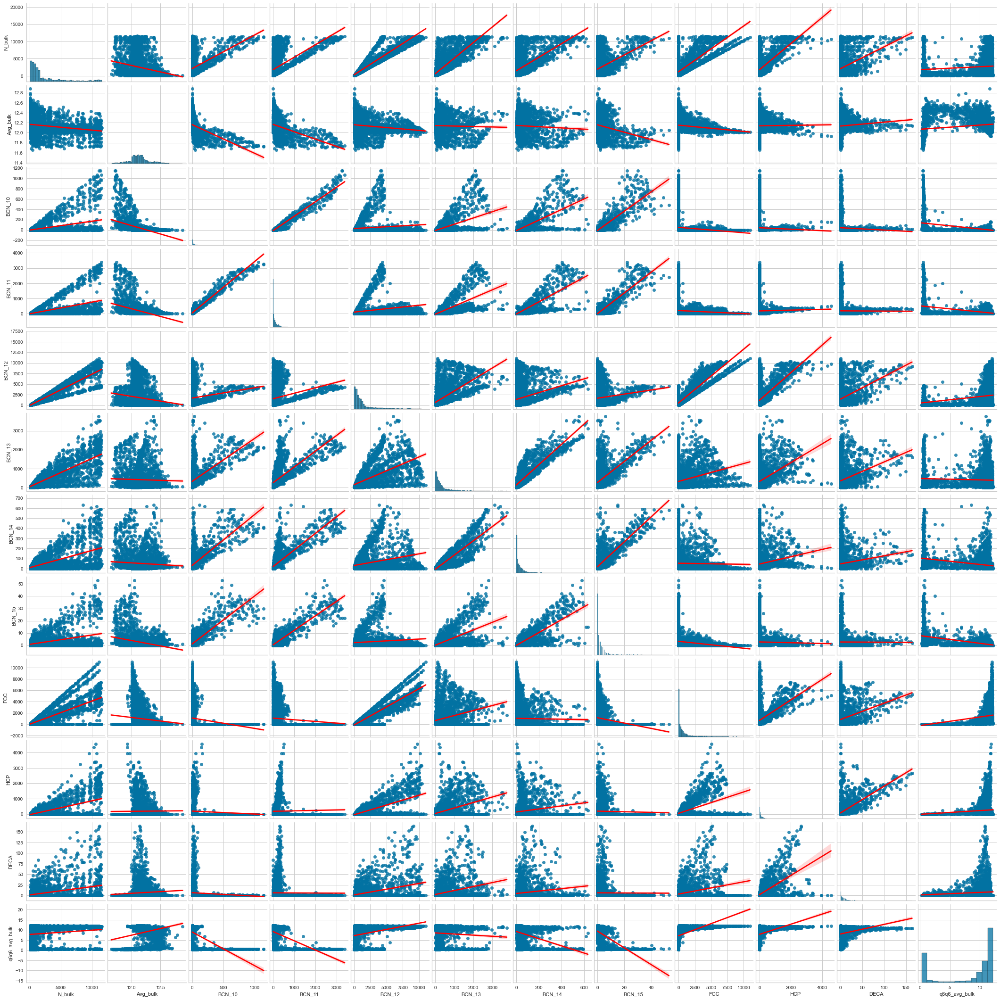

Dataset SURFACE


<Figure size 432x288 with 0 Axes>

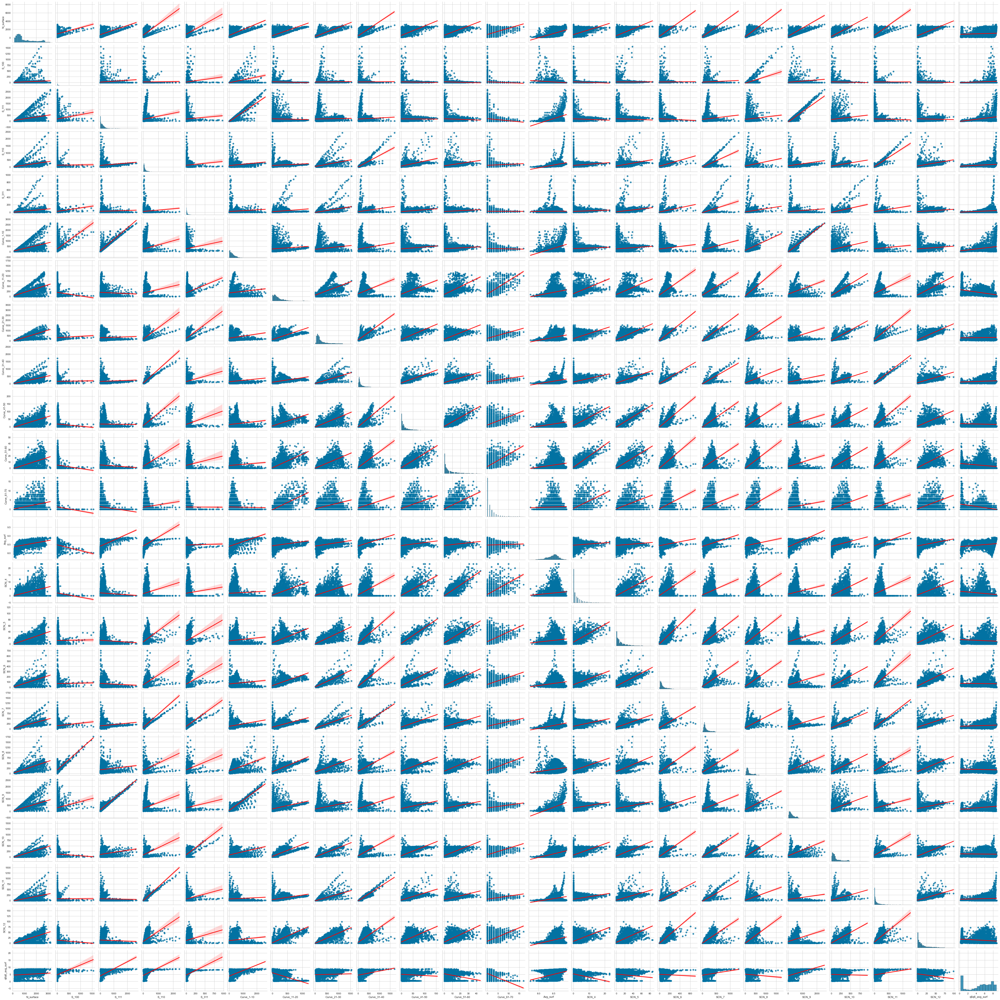

Dataset TOTAL


<Figure size 432x288 with 0 Axes>

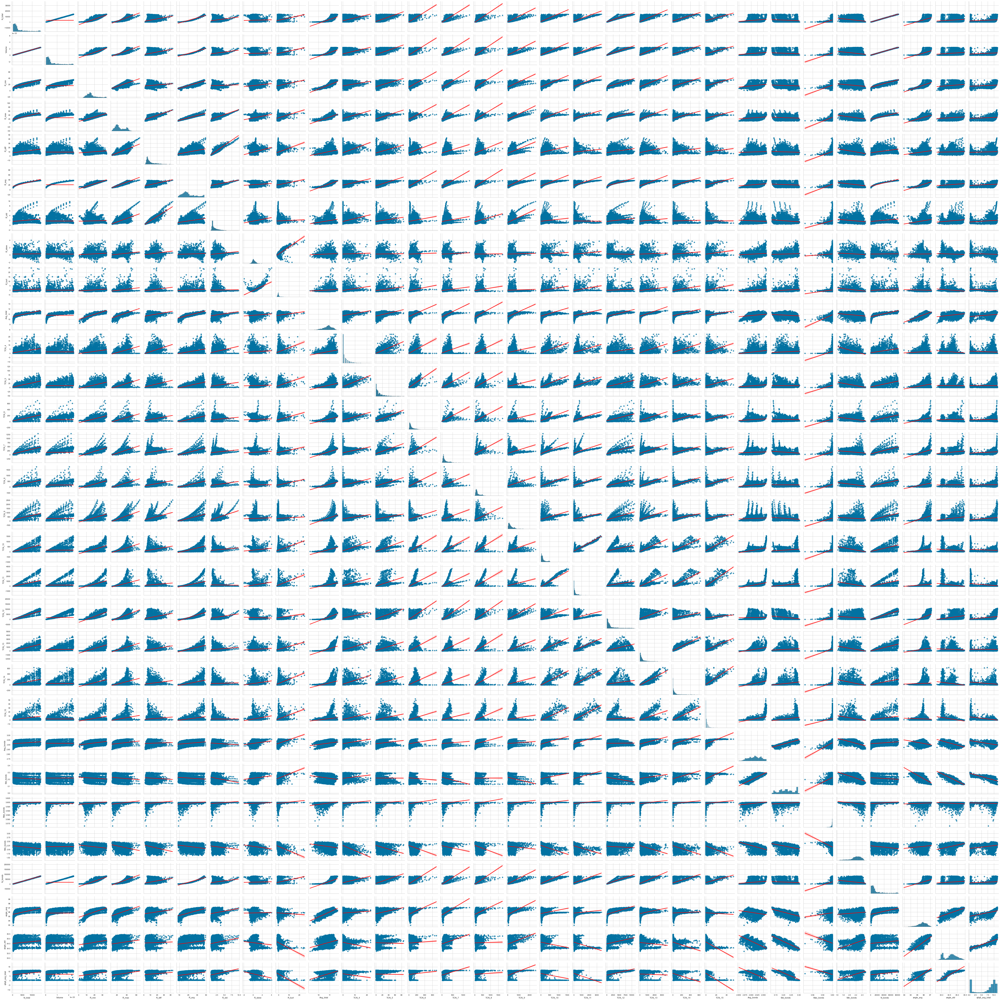

In [213]:
for dataset in datasets:
        plt.figure()
        print("Dataset", dataset.columns[0][2:].upper())
        sns.pairplot(dataset, kind='reg', plot_kws={'line_kws':{'color':'red'}})
        plt.show()

# ${\textcolor{Orange}{\text{Sequential feature selection}}}$ 

La selección secuencial de funciones (de manera similar a la Eliminación de funciones recursivas de Scikit-learn) se usa “para seleccionar automáticamente un subconjunto de funciones que es más relevante para el problema. El objetivo de la selección de características es doble: queremos mejorar la eficiencia computacional y reducir el error de generalización del modelo eliminando características irrelevantes o ruido”.

Probé tanto la selección secuencial hacia adelante (SFS) como la selección secuencial hacia atrás (SBS) de la biblioteca mlxtend de Sebastan Raschka para buscar ese subconjunto óptimo de funciones (para obtener una descripción general completa del método y un gran conjunto de ejemplos detallados, consulte la excelente documentación de Sebastian). Puede descargar y ejecutar el cuaderno completo desde el repositorio de GitHub aquí).

La única diferencia entre SFFS y SBFS es que el primero comienza con 1 función y las agrega una por una, mientras que el segundo comienza con todas las funciones (o un número preseleccionado definido por el usuario) y las elimina una por una. En ambos casos, utilicé el selector como parte de una canalización que incluía la regresión lineal y la validación cruzada de Scikit-learn con Leave One Out (es decir, eliminando un pozo a la vez); por ejemplo, la tubería para SFS es:

---
---

In [251]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.model_selection import LeaveOneOut, GridSearchCV, train_test_split
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
from sklearn import svm, preprocessing

In [261]:
data_bulk

,N_bulk,Avg_bulk,BCN_10,BCN_11,BCN_12,BCN_13,BCN_14,BCN_15,FCC,HCP,DECA,q6q6_avg_bulk
ID,,,,,,,,,,,,
1,1014,12.5552,0,70,434,398,101,11,24,23,8,2.7535
2,1034,12.4952,4,73,470,389,90,8,30,35,7,2.9188
3,3365,12.3902,4,172,1898,1101,178,12,700,376,17,8.4074
4,5292,12.3027,35,191,3407,1445,204,7,1858,823,11,11.0017
5,8508,12.2159,56,357,5993,1847,238,6,3575,1350,28,11.1281
...,...,...,...,...,...,...,...,...,...,...,...,...
3995,683,11.8843,55,166,263,160,26,4,0,0,0,0.5593
3996,950,11.8126,82,255,362,188,45,3,0,0,0,0.5000
3997,1469,11.7971,124,411,552,290,66,3,0,0,0,0.5296


In [263]:
features = data_bulk
features.describe()

,N_bulk,Avg_bulk,BCN_10,BCN_11,BCN_12,BCN_13,BCN_14,BCN_15,FCC,HCP,DECA,q6q6_avg_bulk
count,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000
mean,2521.484371,12.138407,40.012753,188.532883,1815.304576,417.881720,51.990248,2.710178,1002.886722,190.145036,6.380095,8.320049
std,2976.601734,0.164755,124.714478,433.623062,2322.530318,539.448732,87.698097,5.687218,1651.328354,457.700044,16.512962,4.646505
min,89.000000,11.652700,0.000000,0.000000,26.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.263700
25%,618.500000,12.043800,0.000000,8.000000,362.000000,85.000000,5.000000,0.000000,6.000000,0.000000,0.000000,2.417950
50%,1199.000000,12.126100,3.000000,51.000000,859.000000,207.000000,21.000000,1.000000,327.000000,20.000000,0.000000,10.969700
75%,3183.000000,12.210950,21.000000,174.000000,2149.500000,483.000000,55.000000,3.000000,1080.500000,137.000000,6.000000,11.786350
max,11580.000000,12.879300,1146.000000,3384.000000,11062.000000,3758.000000,633.000000,53.000000,10969.000000,4558.000000,164.000000,12.239700


In [264]:
X = features.values

In [266]:
y = data.loc[:, ['Total_E']].values

In [267]:
loo = LeaveOneOut()

In [268]:
LR = LinearRegression()

sfs = SFS(estimator=LR, 
          k_features=1, 
          forward=False, 
          floating=True, 
          scoring='neg_mean_squared_error',
          cv = loo,
          n_jobs = -1)

sfs = sfs.fit(X, y)

Plotting results
Plot function modified from: https://github.com/rasbt/mlxtend/blob/master/mlxtend/plotting/plot_sequential_feature_selection.py

In [269]:


# Sebastian Raschka 2014-2019
# mlxtend Machine Learning Library Extensions
#
# Algorithm for plotting sequential feature selection.
# Author: Sebastian Raschka <sebastianraschka.com>
#
# License: BSD 3 clause

##### Added by Matteo ######
font = {'size'   : 18}
plt.rc('font', **font) 
plt.rc('ytick',labelsize=18)
############################


def plot_sequential_feature_selection(metric_dict,
                                      kind='std_dev',
                                      color='blue',
                                      bcolor='steelblue',
                                      marker='o',
                                      alpha=0.2,
                                      ylabel='Performance',
                                      confidence_interval=0.95):
    """Plot feature selection results.

    Parameters
    ----------
    metric_dict : mlxtend.SequentialFeatureSelector.get_metric_dict() object
    kind : str (default: "std_dev")
        The kind of error bar or confidence interval in
        {'std_dev', 'std_err', 'ci', None}.
    color : str (default: "blue")
        Color of the lineplot (accepts any matplotlib color name)
    bcolor : str (default: "steelblue").
        Color of the error bars / confidence intervals
        (accepts any matplotlib color name).
    marker : str (default: "o")
        Marker of the line plot
        (accepts any matplotlib marker name).
    alpha : float in [0, 1] (default: 0.2)
        Transparency of the error bars / confidence intervals.
    ylabel : str (default: "Performance")
        Y-axis label.
    confidence_interval : float (default: 0.95)
        Confidence level if `kind='ci'`.

    Returns
    ----------
    fig : matplotlib.pyplot.figure() object

    Examples
    -----------
    For usage examples, please see
    http://rasbt.github.io/mlxtend/user_guide/plotting/plot_sequential_feature_selection/

    """

    allowed = {'std_dev', 'std_err', 'ci', None}
    if kind not in allowed:
        raise AttributeError('kind not in %s' % allowed)

    fig = plt.figure(figsize=(14,12)) 
    k_feat = sorted(metric_dict.keys())
    avg = [metric_dict[k]['avg_score'] for k in k_feat]

    if kind:
        upper, lower = [], []
        if kind == 'ci':
            kind = 'ci_bound'

        for k in k_feat:
            upper.append(metric_dict[k]['avg_score'] +
                         metric_dict[k][kind])
            lower.append(metric_dict[k]['avg_score'] -
                         metric_dict[k][kind])

        plt.fill_between(k_feat,
                         upper,
                         lower,
                         alpha=alpha,
                         color=bcolor,
                         lw=1)

        if kind == 'ci_bound':
            kind = 'Confidence Interval (%d%%)' % (confidence_interval * 100)

    plt.plot(k_feat, avg, color=color, marker=marker)
    plt.ylabel(ylabel)
    plt.xlabel('Number of Features')
    feature_min = len(metric_dict[k_feat[0]]['feature_idx'])
    feature_max = len(metric_dict[k_feat[-1]]['feature_idx'])
    plt.xticks(range(feature_min, feature_max + 1),
               range(feature_min, feature_max + 1))
    return fig

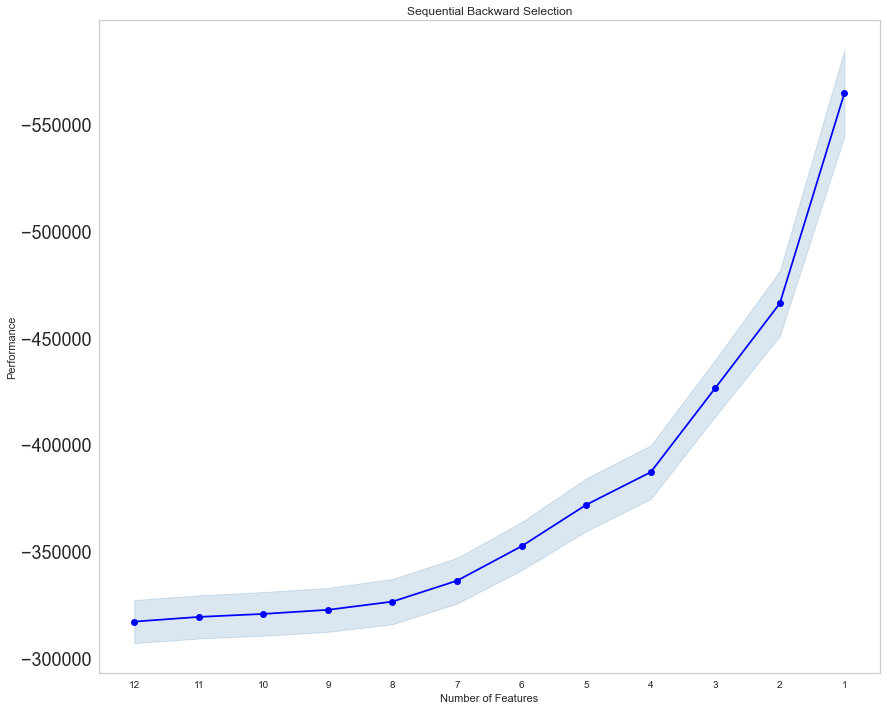

In [270]:
plot_sequential_feature_selection(sfs.get_metric_dict(), kind='std_err')
plt.title('Sequential Backward Selection')
plt.grid()
plt.gca().invert_yaxis()
plt.gca().invert_xaxis();

Save results to dataframe

In [271]:

selected_summary = pd.DataFrame.from_dict(sfs.get_metric_dict()).T
selected_summary['index'] = selected_summary.index
selected_summary.sort_values(by='avg_score', ascending=0)

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err,index
12,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11)","[-155682.6204334646, -8050.798387294328, -2869...",-317107.251995,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11)",19773.899779,637726.063599,10085.8562,12
11,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 11)","[-150701.99265194137, -6967.742431391116, -303...",-319305.312184,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 11)",19832.397953,639612.682358,10115.693723,11
10,"(0, 1, 3, 4, 6, 7, 8, 9, 10, 11)","[-77567.02907431923, -212.80309120886156, -202...",-320714.539116,"(0, 1, 3, 4, 6, 7, 8, 9, 10, 11)",20094.815384,648075.880657,10249.542103,10
9,"(0, 1, 3, 4, 6, 7, 8, 9, 11)","[-75888.03602265811, -113.04155924173048, -218...",-322619.498332,"(0, 1, 3, 4, 6, 7, 8, 9, 11)",20183.637239,650940.46543,10294.846493,9
8,"(0, 1, 3, 4, 7, 8, 9, 11)","[-70870.41506324151, -140.89261432438462, -153...",-326476.944487,"(0, 1, 3, 4, 7, 8, 9, 11)",20776.579541,670063.388289,10597.28207,8
7,"(0, 3, 4, 7, 8, 9, 11)","[-221587.12960756084, -39977.30519770896, -140...",-336261.352795,"(0, 3, 4, 7, 8, 9, 11)",20962.563735,676061.545917,10692.144988,7
6,"(0, 3, 4, 7, 8, 9)","[-276594.3812933794, -84983.86562552542, -7093...",-352417.562482,"(0, 3, 4, 7, 8, 9)",22068.926035,711742.725802,11256.455074,6
5,"(0, 3, 4, 8, 9)","[-14.34444140350136, -3833.1963845781347, -443...",-371802.961131,"(0, 3, 4, 8, 9)",24302.328336,783771.959955,12395.622091,5
4,"(0, 6, 8, 9)","[-8612.699304139198, -102.5098114465895, -1204...",-387105.055342,"(0, 6, 8, 9)",24583.2195,792830.952807,12538.893167,4
3,"(0, 8, 9)","[-32576.601046588086, -43207.17552647043, -555...",-426487.641162,"(0, 8, 9)",25979.291233,837855.522602,13250.972165,3


Obtaining the best k feature

In [272]:

feature_idx = np.array(selected_summary.loc[4]['feature_idx'])
feature_idx

array([0, 6, 8, 9])

In [273]:
selected = features.iloc[:,feature_idx]
print(list(selected))

['N_bulk', 'BCN_14', 'FCC', 'HCP']


In [274]:
selected

,N_bulk,BCN_14,FCC,HCP
ID,,,,
1,1014,101,24,23
2,1034,90,30,35
3,3365,178,700,376
4,5292,204,1858,823
5,8508,238,3575,1350
...,...,...,...,...
3995,683,26,0,0
3996,950,45,0,0
3997,1469,66,0,0


Quita tambien demasiadas variables

---
---

Como se quietan demasiadas variables con imoportancia fisica, se procede a separar la base de datos en sunconjuntos

In [275]:
data_bulk

,N_bulk,Avg_bulk,BCN_10,BCN_11,BCN_12,BCN_13,BCN_14,BCN_15,FCC,HCP,DECA,q6q6_avg_bulk
ID,,,,,,,,,,,,
1,1014,12.5552,0,70,434,398,101,11,24,23,8,2.7535
2,1034,12.4952,4,73,470,389,90,8,30,35,7,2.9188
3,3365,12.3902,4,172,1898,1101,178,12,700,376,17,8.4074
4,5292,12.3027,35,191,3407,1445,204,7,1858,823,11,11.0017
5,8508,12.2159,56,357,5993,1847,238,6,3575,1350,28,11.1281
...,...,...,...,...,...,...,...,...,...,...,...,...
3995,683,11.8843,55,166,263,160,26,4,0,0,0,0.5593
3996,950,11.8126,82,255,362,188,45,3,0,0,0,0.5000
3997,1469,11.7971,124,411,552,290,66,3,0,0,0,0.5296


---
---


### ${\textcolor{red}{\text{Info de todos los modelos que llevo calculados}}}$ 

In [286]:
info = pd.concat([pd.read_csv("src/data/model_info/model_info_quick.csv"), pd.read_csv("src/data/model_info/model_aux.csv"), pd.read_csv("src/data/model_info/model_info.csv")], ignore_index=True)

In [288]:
info.sort_values(" RMSE")

,model_name,data_set,N,HyperParam,Best Score,R2,MAE,MSE,RMSE,MAPE,under,over
50,LinearRegression,data_total,134,"{'cv': RepeatedKFold(n_repeats=3, n_splits=5, ...",9.999796e-01,1.0000,41.4694,3.588768e+03,59.9063,0.6254,0.0000,0.000000e+00
51,Ridge,data_total,134,"{'cv': RepeatedKFold(n_repeats=3, n_splits=5, ...",9.999783e-01,1.0000,43.3007,3.972237e+03,63.0257,0.6291,0.0000,0.000000e+00
53,ElasticNet,data_total,134,"{'cv': RepeatedKFold(n_repeats=3, n_splits=5, ...",9.999779e-01,1.0000,43.6274,4.064197e+03,63.7511,0.6144,0.0000,0.000000e+00
52,Lasso,data_total,134,"{'cv': RepeatedKFold(n_repeats=3, n_splits=5, ...",9.999779e-01,1.0000,43.5114,4.076636e+03,63.8485,0.6200,0.0000,0.000000e+00
12,KernelRidge,total,51,"{'cv': RepeatedKFold(n_repeats=3, n_splits=5, ...",9.999766e-01,1.0000,48.4864,6.746233e+03,82.1355,0.5844,0.0000,0.000000e+00
2,Ridge,total,51,"{'cv': RepeatedKFold(n_repeats=3, n_splits=5, ...",9.999276e-01,0.9999,76.6581,1.373998e+04,117.2177,0.9883,0.0001,1.000000e-04
9,LinearRegression,total,51,"{'cv': RepeatedKFold(n_repeats=3, n_splits=5, ...",-1.909062e+08,0.9999,77.0101,1.375293e+04,117.2729,1.0212,0.0001,1.909062e+08
20,ElasticNet,total,51,"{'cv': RepeatedKFold(n_repeats=3, n_splits=5, ...",9.999235e-01,0.9999,77.6572,1.429949e+04,119.5805,0.9616,0.0001,1.000000e-04
15,Lasso,total,51,"{'cv': RepeatedKFold(n_repeats=3, n_splits=5, ...",9.999219e-01,0.9999,77.9457,1.475645e+04,121.4761,0.9497,0.0001,1.000000e-04
54,ExtraTreesRegressor,data_total,134,"{'cv': RepeatedKFold(n_repeats=3, n_splits=5, ...",9.998906e-01,0.9999,66.3123,1.573373e+04,125.4342,0.5859,0.0001,1.000000e-04


In [301]:
info.columns

Index(['model_name ', ' data_set', ' N', ' HyperParam', ' Best Score', ' R2',
       ' MAE', ' MSE', ' RMSE', ' MAPE', ' under', ' over '],
      dtype='object')

In [312]:
params_best_random_forest = info[info["model_name "]=="RandomForestRegressor" ][" HyperParam"].loc[32]

In [318]:
params_best_random_forest

"{'cv': RepeatedKFold(n_repeats=3, n_splits=5, random_state=1), 'error_score': nan, 'estimator__bootstrap': True, 'estimator__ccp_alpha': 0.0, 'estimator__criterion': 'squared_error', 'estimator__max_depth': None, 'estimator__max_features': 1.0, 'estimator__max_leaf_nodes': None, 'estimator__max_samples': None, 'estimator__min_impurity_decrease': 0.0, 'estimator__min_samples_leaf': 1, 'estimator__min_samples_split': 2, 'estimator__min_weight_fraction_leaf': 0.0, 'estimator__n_estimators': 100, 'estimator__n_jobs': None, 'estimator__oob_score': False, 'estimator__random_state': None, 'estimator__verbose': 0, 'estimator__warm_start': False, 'estimator': RandomForestRegressor(), 'n_jobs': -1, 'param_grid': {'bootstrap': [True, False], 'max_features': [0.3, 0.5, 0.7, 1.0], 'min_samples_leaf': [1, 2], 'n_estimators': [100, 500], 'oob_score': [True, False], 'random_state': [None, 0]}, 'pre_dispatch': '2*n_jobs', 'refit': True, 'return_train_score': False, 'scoring': 'r2', 'verbose': 0}"

In [317]:
# Load from file
with open("src/model/submodels/finalized_RandomForestRegressor_total_model.sav", 'rb') as file:
    pickle_model = pickle.load(file)
    
# Calculate the accuracy score and predict target values
score = pickle_model.score(X_test, y_test)
print("Test score: {0:.2f} %".format(100 * score))


NotFittedError: This RandomForestRegressor instance is not fitted yet. Call 'fit' with appropriate arguments before using this estimator.

QUiero MORIR

---
---


### ${\textcolor{ORANGE}{\text{Random Forest features importances }}}$ 


In [321]:
#Implementamos un random forest
rnd_reg = RandomForestRegressor(bootstrap = True, ccp_alpha = 0.0, 
criterion = "squared_error", max_depth = None, max_features = 1.0, max_leaf_nodes =  None,
max_samples = None, min_impurity_decrease = 0.0, min_samples_leaf = 1, min_samples_split = 2, 
min_weight_fraction_leaf = 0.0, n_estimators = 100, n_jobs = None, oob_score = False, 
random_state = None, verbose = 0, warm_start = False)

In [324]:
X_train, X_test, y_train, y_test = train_test_split(data.drop("Total_E", axis=1), data["Total_E"], test_size=0.25, random_state=42)

In [326]:
rnd_reg.fit(X_train, y_train)

print("R2 score train",rnd_reg.score(X_train,y_train))
print("R2 score test",rnd_reg.score(X_test,y_test))

R2 score train 0.9999715717453695
R2 score test 0.9997959231248005


In [327]:
#Obtenemos el feature_importances
rnd_reg.feature_importances_

array([2.36025623e-05, 8.87803733e-01, 1.00427874e-04, 3.78256308e-05,
       0.00000000e+00, 6.72380461e-06, 4.47868264e-06, 4.32611048e-06,
       2.69275478e-05, 1.14672939e-05, 3.90416257e-06, 5.59848292e-06,
       5.38690868e-06, 3.10076296e-06, 8.92954984e-06, 1.71150575e-05,
       3.55519178e-06, 2.07183995e-06, 1.49671673e-05, 6.10215219e-06,
       6.41817008e-06, 1.85771638e-06, 2.54470808e-06, 1.12562832e-05,
       7.49296219e-06, 3.71107001e-06, 1.19925997e-06, 2.62969064e-06,
       4.07579903e-06, 4.46848595e-06, 2.67688607e-06, 3.27846944e-06,
       2.31435928e-06, 2.96485969e-06, 7.70342760e-06, 3.37339964e-06,
       1.44083927e-06, 8.04533369e-07, 1.78233634e-06, 3.50533356e-06,
       8.89750059e-06, 3.95871958e-06, 1.53294791e-06, 5.57757909e-07,
       1.54406800e-06, 2.12511614e-06, 3.05260251e-06, 5.32937466e-06,
       2.75525360e-06, 2.31590294e-06, 1.07622534e-05, 9.85354680e-06,
       4.17660241e-06, 1.58895090e-05, 1.04750756e-05, 7.15789396e-06,
      

In [330]:
fi_rnd= pd.DataFrame(rnd_reg.feature_importances_,
                          data.columns.drop("Total_E"), 
                          columns = ["Feature imp. RND"]).sort_values("Feature imp. RND", ascending=False)
fi_rnd

,Feature imp. RND
N_total,8.878037e-01
N_bonds,1.116314e-01
N_bulk,1.004279e-04
Formation_E,7.295418e-05
N_surface,3.782563e-05
...,...
TCN_14,1.440839e-06
TCN_4,1.199260e-06
TCN_15,8.045334e-07
BCN_15,5.577579e-07


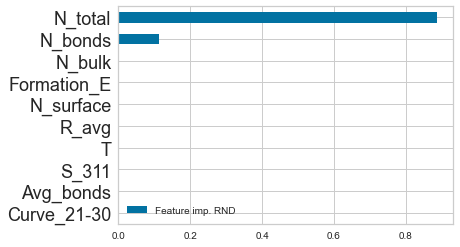

In [334]:
#Visualizamos
fi_rnd.iloc[0:10, :].sort_values("Feature imp. RND").plot.barh(y='Feature imp. RND');

---
---


### ${\textcolor{ORANGE}{\text{Independencia del numero de atomos}}}$ 

In [21]:
data

,T,tau,N_total,N_bulk,N_surface,Volume,R_min,R_max,R_diff,R_avg,...,q6q6_S4,q6q6_S5,q6q6_S6,q6q6_S7,q6q6_S8,q6q6_S9,q6q6_S10,q6q6_S11,Total_E,Formation_E
ID,,,,,,,,,,,,,,,,,,,,,
1,273,0.000025,1599,1014,585,2.710000e-26,15.5898,19.4516,3.8618,17.3706,...,33,25,18,18,13,18,1,0,-5908.6345,343.4555
2,273,0.000025,1642,1034,608,2.780000e-26,15.3996,24.1755,8.7760,17.6061,...,32,26,26,6,15,12,2,0,-6035.4034,384.8166
3,273,0.000025,4637,3365,1272,7.850000e-26,21.9199,31.0305,9.1106,25.3692,...,95,99,117,123,99,116,51,17,-17330.1660,800.5040
4,273,0.000025,7189,5292,1897,1.220000e-25,23.2542,37.8795,14.6253,29.7011,...,135,147,188,214,227,227,121,64,-26937.2010,1171.7890
5,273,0.000025,11004,8508,2496,1.860000e-25,27.1200,39.7614,12.6415,34.2831,...,154,190,281,308,287,320,156,74,-41427.9010,1597.7390
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3995,973,0.000250,1201,683,518,2.030000e-26,11.7580,31.2844,19.5264,16.7874,...,2,0,0,0,0,0,0,0,-4230.5430,465.3670
3996,973,0.000250,1509,950,559,2.550000e-26,13.8048,23.1729,9.3681,17.4079,...,3,0,0,1,0,0,0,0,-5346.9589,553.2311
3997,973,0.000250,2315,1469,846,3.920000e-26,12.0020,36.7573,24.7553,21.2937,...,4,0,0,0,0,0,0,0,-8218.1252,833.5248


In [22]:
data["E_atomo"] = data["Total_E"]/data["N_total"]

In [24]:
data.drop("Total_E", axis=1)

,T,tau,N_total,N_bulk,N_surface,Volume,R_min,R_max,R_diff,R_avg,...,q6q6_S4,q6q6_S5,q6q6_S6,q6q6_S7,q6q6_S8,q6q6_S9,q6q6_S10,q6q6_S11,Formation_E,E_atomo
ID,,,,,,,,,,,,,,,,,,,,,
1,273,0.000025,1599,1014,585,2.710000e-26,15.5898,19.4516,3.8618,17.3706,...,33,25,18,18,13,18,1,0,343.4555,-3.695206
2,273,0.000025,1642,1034,608,2.780000e-26,15.3996,24.1755,8.7760,17.6061,...,32,26,26,6,15,12,2,0,384.8166,-3.675642
3,273,0.000025,4637,3365,1272,7.850000e-26,21.9199,31.0305,9.1106,25.3692,...,95,99,117,123,99,116,51,17,800.5040,-3.737366
4,273,0.000025,7189,5292,1897,1.220000e-25,23.2542,37.8795,14.6253,29.7011,...,135,147,188,214,227,227,121,64,1171.7890,-3.747003
5,273,0.000025,11004,8508,2496,1.860000e-25,27.1200,39.7614,12.6415,34.2831,...,154,190,281,308,287,320,156,74,1597.7390,-3.764804
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3995,973,0.000250,1201,683,518,2.030000e-26,11.7580,31.2844,19.5264,16.7874,...,2,0,0,0,0,0,0,0,465.3670,-3.522517
3996,973,0.000250,1509,950,559,2.550000e-26,13.8048,23.1729,9.3681,17.4079,...,3,0,0,1,0,0,0,0,553.2311,-3.543379
3997,973,0.000250,2315,1469,846,3.920000e-26,12.0020,36.7573,24.7553,21.2937,...,4,0,0,0,0,0,0,0,833.5248,-3.549946


In [25]:
#Implementamos un random forest
rnd_reg = RandomForestRegressor(bootstrap = True, ccp_alpha = 0.0, 
criterion = "squared_error", max_depth = None, max_features = 1.0, max_leaf_nodes =  None,
max_samples = None, min_impurity_decrease = 0.0, min_samples_leaf = 1, min_samples_split = 2, 
min_weight_fraction_leaf = 0.0, n_estimators = 100, n_jobs = None, oob_score = False, 
random_state = None, verbose = 0, warm_start = False)

In [26]:
X_train, X_test, y_train, y_test = train_test_split(data.drop("E_atomo", axis=1), data["E_atomo"], test_size=0.25, random_state=42)


In [29]:
rnd_reg.fit(X_train, y_train)

print("R2 score train",rnd_reg.score(X_train,y_train))
print("R2 score test",rnd_reg.score(X_test,y_test))

R2 score train 0.9992142967846448
R2 score test 0.9952904454227133


In [30]:
#Obtenemos el feature_importances
rnd_reg.feature_importances_

array([3.61213494e-01, 5.08249432e-02, 9.99622926e-04, 1.20560722e-02,
       2.90706646e-02, 0.00000000e+00, 5.48581361e-04, 3.80305600e-02,
       9.69942314e-05, 4.63600658e-03, 1.81878402e-04, 1.03192082e-04,
       9.13662354e-05, 3.60960046e-05, 2.78626541e-03, 4.80419736e-03,
       3.36640644e-04, 4.55158930e-03, 6.42132812e-04, 8.00549314e-04,
       1.49170735e-04, 1.25515652e-04, 4.02379254e-05, 2.49263615e-05,
       1.07795103e-01, 2.48922001e-04, 4.99508272e-03, 2.22105281e-05,
       5.13327941e-05, 6.26806021e-05, 8.66628447e-05, 1.73409877e-04,
       2.04888589e-03, 1.18278863e-03, 2.96094351e-04, 3.37729970e-03,
       1.95040064e-03, 5.87646988e-04, 4.14160593e-05, 8.04372115e-05,
       3.02477100e-04, 2.79478322e-03, 1.54792218e-03, 5.39143295e-04,
       4.02460601e-05, 1.95063477e-05, 7.67817059e-05, 5.31492320e-05,
       7.86957897e-05, 5.38327458e-04, 8.37068652e-03, 4.64657966e-03,
       2.69166955e-04, 6.15268114e-05, 3.45687815e-04, 8.24736234e-03,
      

In [31]:
fi_rnd= pd.DataFrame(rnd_reg.feature_importances_,
                          data.columns.drop("Total_E"), 
                          columns = ["Feature imp. RND"]).sort_values("Feature imp. RND", ascending=False)
fi_rnd

,Feature imp. RND
T,0.361213
angle_avg,0.144543
Avg_total,0.107795
Formation_E,0.102118
tau,0.050825
...,...
S_100,0.000036
Curve_61-70,0.000025
TCN_4,0.000022
SCN_4,0.000020


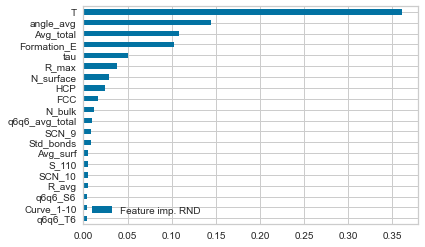

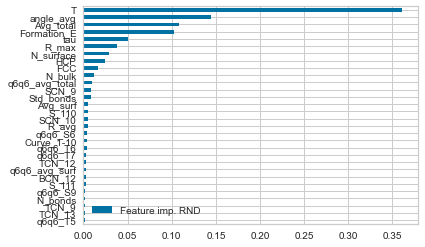

In [44]:
#Visualizamos

fi_rnd.iloc[0:20, :].sort_values("Feature imp. RND").plot.barh(y='Feature imp. RND');

fi_rnd.iloc[0:30, :].sort_values("Feature imp. RND").plot.barh(y='Feature imp. RND');

#### Entreno modelos con los features importance de data

Index(['Feature imp. RND'], dtype='object')

In [62]:
fi = fi_rnd.iloc[0:20, 0].index.to_list()

In [64]:
fi

['T',
 'angle_avg',
 'Avg_total',
 'Formation_E',
 'tau',
 'R_max',
 'N_surface',
 'HCP',
 'FCC',
 'N_bulk',
 'q6q6_avg_total',
 'SCN_9',
 'Std_bonds',
 'Avg_surf',
 'S_110',
 'SCN_10',
 'R_avg',
 'q6q6_S6',
 'Curve_1-10',
 'q6q6_T6']

In [101]:
data_fi = data[fi]

In [102]:
data_fi

,T,angle_avg,Avg_total,Formation_E,tau,R_max,N_surface,HCP,FCC,N_bulk,q6q6_avg_total,SCN_9,Std_bonds,Avg_surf,S_110,SCN_10,R_avg,q6q6_S6,Curve_1-10,q6q6_T6
ID,,,,,,,,,,,,,,,,,,,,
1,273,95.5363,11.1770,343.4555,0.000025,19.4516,585,23,24,1014,2.5153,169,0.22398,8.7880,119,91,17.3706,18,105,47
2,273,95.5073,11.0719,384.8166,0.000025,24.1755,608,35,30,1034,2.5335,172,0.23034,8.6513,81,101,17.6061,26,111,71
3,273,96.0506,11.3862,800.5040,0.000025,31.0305,1272,376,700,3365,7.3030,386,0.20972,8.7303,168,236,25.3692,117,306,267
4,273,96.3417,11.3198,1171.7890,0.000025,37.8795,1897,823,1858,5292,9.5565,490,0.19347,8.5778,246,331,29.7011,188,383,275
5,273,96.5052,11.3851,1597.7390,0.000025,39.7614,2496,1350,3575,8508,9.8630,575,0.18423,8.5533,269,449,34.2831,281,451,393
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3995,973,95.0182,10.2931,465.3670,0.000250,31.2844,518,0,0,683,0.4779,103,0.29196,8.1950,32,73,16.7874,0,37,3
3996,973,95.2984,10.5010,553.2311,0.000250,23.1729,559,0,0,950,0.4374,130,0.29265,8.2719,26,78,17.4079,0,52,1
3997,973,95.3473,10.5114,833.5248,0.000250,36.7573,846,0,0,1469,0.4700,174,0.29131,8.2790,59,117,21.2937,0,89,1



## Scaling with StandardScaler

Realizamos escalado por StandarScaler y evaluamos resultados a primera aproximación.

array([[<AxesSubplot:title={'center':'T'}>,
        <AxesSubplot:title={'center':'angle_avg'}>,
        <AxesSubplot:title={'center':'Avg_total'}>,
        <AxesSubplot:title={'center':'Formation_E'}>],
       [<AxesSubplot:title={'center':'tau'}>,
        <AxesSubplot:title={'center':'R_max'}>,
        <AxesSubplot:title={'center':'N_surface'}>,
        <AxesSubplot:title={'center':'HCP'}>],
       [<AxesSubplot:title={'center':'FCC'}>,
        <AxesSubplot:title={'center':'N_bulk'}>,
        <AxesSubplot:title={'center':'q6q6_avg_total'}>,
        <AxesSubplot:title={'center':'SCN_9'}>],
       [<AxesSubplot:title={'center':'Std_bonds'}>,
        <AxesSubplot:title={'center':'Avg_surf'}>,
        <AxesSubplot:title={'center':'S_110'}>,
        <AxesSubplot:title={'center':'SCN_10'}>],
       [<AxesSubplot:title={'center':'R_avg'}>,
        <AxesSubplot:title={'center':'q6q6_S6'}>,
        <AxesSubplot:title={'center':'Curve_1-10'}>,
        <AxesSubplot:title={'center':'q6q6_T6'}>]],

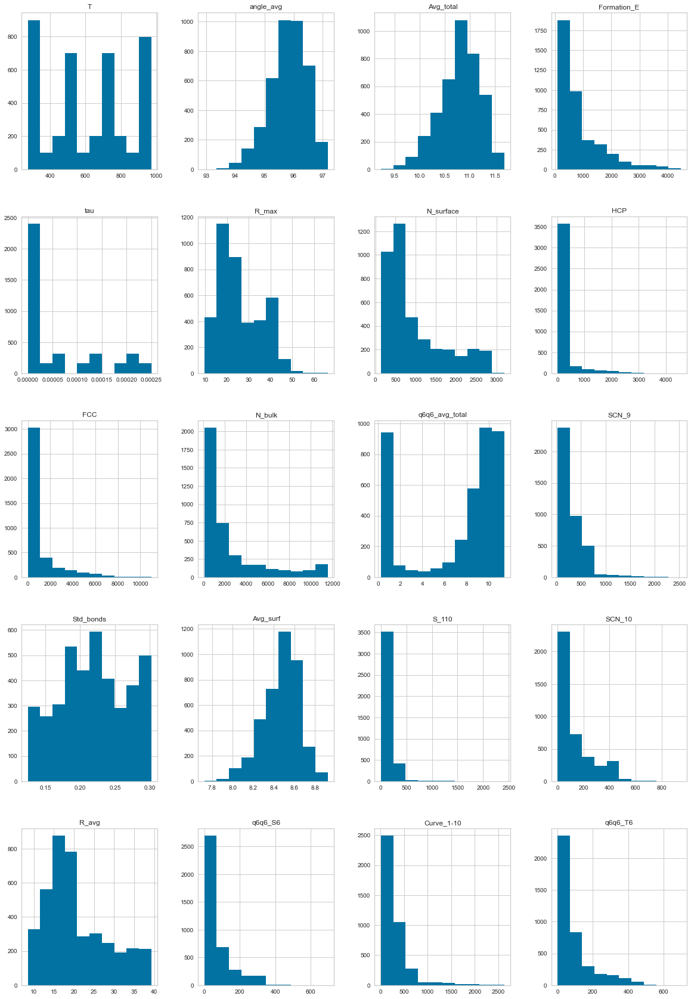

In [103]:
data_fi.hist(figsize=(20,30))

In [91]:
X_train, X_test, y_train, y_test = train_test_split(data_fi, data["E_atomo"], test_size=0.25, random_state=42)


In [105]:

std_scale = StandardScaler().fit(X_train)
X_train_scal = std_scale.transform(X_train)


---
---


Entreno modelos con esta data

In [1]:
data_fi

NameError: name 'data_fi' is not defined

In [ ]:

def modeling_scoring(model, parameters, data, data_set_name, target):
    
    print(model)

    X = data.drop([target], 1)
    y = data[[target]].squeeze()
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1234)
    cv = RepeatedKFold(n_splits=5, n_repeats=3, random_state=1)

    modelo_grid = GridSearchCV(estimator= model, 
    param_grid = parameters,
    scoring = "r2", 
    cv = cv, n_jobs= -1)

    start = dt.now()

    mejor_modelo = modelo_grid.fit(X_train, y_train)

    print('Best Hyperparameters: %s' % mejor_modelo.best_params_)
    print('Best Score: %s' % mejor_modelo.best_score_)
    
    print()
    train_time = (dt.now() - start).seconds
    print("\tTraining time: %0.3fs" % train_time)
    
    start = dt.now()
    y_pred = mejor_modelo.predict(X_test)
    predict_time = (dt.now() - start).seconds 
    print("\tPrediction time: %0.3fs" % predict_time)
    print()

    r2 = round(r2_score(y_test, y_pred), 4)
    print("\tR^2 score:", r2)
    mae = round(mean_absolute_error(y_test, y_pred), 4)
    print("\tMAE score:", mae )
    mse = round(mean_squared_error(y_test, y_pred), 4)
    print("\tMSE score:", mse)
    rmse = round(np.sqrt(mean_squared_error(y_test, y_pred)), 4)
    print("\tRMSE score:", rmse)
    under = 1.0000-round(r2_score(y_test, y_pred), 4)
    print("\tunder: ", under)
    over = 1.0000-round(mejor_modelo.best_score_, 4)
    print("\tover: ", over)

    
    def mean_absolute_percentage_error(y_pred, y_true): 
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    mape = round(mean_absolute_percentage_error(y_test, y_pred), 4)
    print("\tMAPE score:", mape)


    row=[model.__class__.__name__, data_set_name, len(X.columns), mejor_modelo.get_params(), mejor_modelo.best_score_ , r2, mae, mse, rmse, mape, under, over ]
    guardar_en_fichero("data/model_info/model_info_quick.csv", row)

    # save the model to disk
    filename = f'model/submodels/finalized_{model.__class__.__name__}_{data_set_name}_model.sav'
    pickle.dump(mejor_modelo, open(filename, 'wb'))


---
---

---
---

In [ ]:
#AUTOMATIZACIÓN DE LIMPIEZA
def read_data(path):
    data = pd.read_csv(path).dropna()
    data.set_index('ID', inplace = True)
    return data

def del_zeros(data, percent):
    precent_zeros = (data==0).sum()*100/len(data)
    zeros_value_df = pd.DataFrame({'column_name': data.columns,
                                'percent_zeros': precent_zeros}).sort_values('percent_zeros', ascending=False)

    cols_to_drop = zeros_value_df[zeros_value_df['percent_zeros'] > percent].index.values
    print("Cols:", cols_to_drop)

    print("Columnas pre drop:", len(data.columns))

    data.drop(columns=cols_to_drop, inplace=True)

    print("Columnas post drop:", len(data.columns))
    return data

def del_no_vip(data):
    q6q6_avg = data[["q6q6_avg_total", "q6q6_avg_bulk", "q6q6_avg_surf"]]
    data = data.loc[:, ~data.columns.str.startswith('q6q6')]
    data = data.join(q6q6_avg)
    data=data.drop("time", axis=1)
    return data

def create_subdatasets():
    bulk = [i for i in data if  any(re.findall( "bulk|BCN_|FCC|HCP|ICOS|DECA" , i)) | (i.startswith('B')) | ("_B" in i)]
    super = [i for i in data if  any(re.findall( "surf|_S" , i)) | any(map(i.startswith, ["S_","Curve","SCN_"]))]
    totales = [i for i in data if  any(re.findall( "total|Volume|_T|bonds|angle" , i)) |  any(map(i.startswith, ['R',"TCN_"]))]

    data_bulk = data[bulk]
    data_super = data[super]
    data_total = data[totales]
######################
def calcular_VIF(var_predictoras_df):
    var_pred_labels = list(var_predictoras_df.columns)
    num_var_pred = len(var_pred_labels)
    
    lr_model = LinearRegression()
    
    vifs = pd.DataFrame(index = ['VIF'], columns = var_pred_labels)
    vifs = vifs.fillna(0)
    
    for i in range(num_var_pred):
        x_features = var_pred_labels[:]
        y_feature = var_pred_labels[i]
        x_features.remove(y_feature)
        
        x = var_predictoras_df[x_features]
        y = var_predictoras_df[y_feature]
        
        lr_model.fit(var_predictoras_df[x_features], var_predictoras_df[y_feature])
        r2=lr_model.score(var_predictoras_df[x_features], var_predictoras_df[y_feature])
        vifs[y_feature] = 1/(1 - r2)
    
    return vifs



def Select_Data_con_VIF(var_predictoras_df, max_VIF = 10):
    vifs_calculados = var_predictoras_df.copy(deep = True)
    
    VIF = calcular_VIF(vifs_calculados)
    
    while VIF.values.max() > max_VIF:
        col_max = np.where(VIF == VIF.values.max())[1][0]
        features = list(vifs_calculados.columns)
        features.remove(features[col_max])
        vifs_calculados = vifs_calculados[features]
        
        VIF = calcular_VIF(vifs_calculados)
        
    return vifs_calculados